# Comic Book Hero Analysis

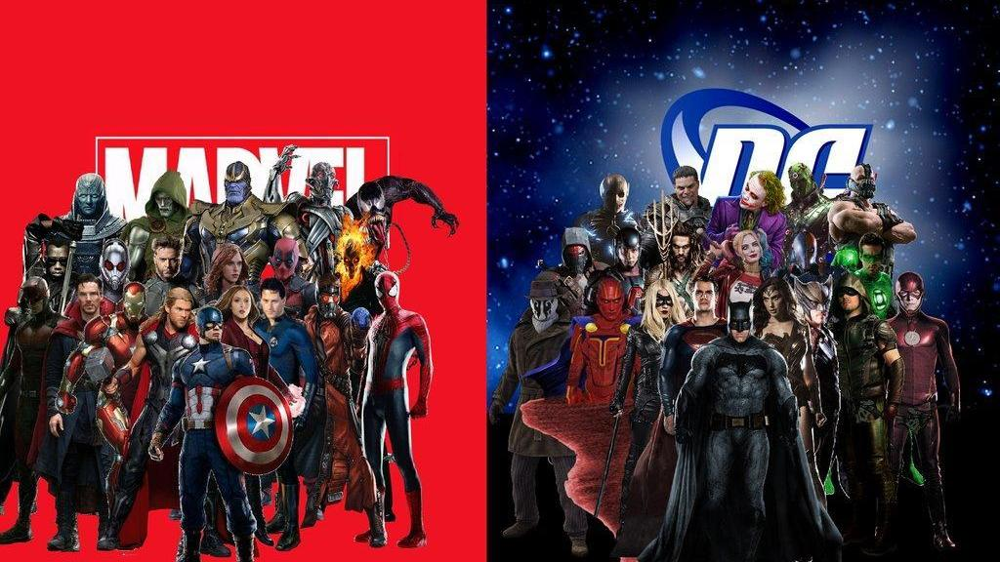

I will do a joint analysis of both DC and Marvel along with a compartitive analysis between both Marvel and DC

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
dc = pd.read_csv('dc.csv')
marvel = pd.read_csv('marvel.csv')

In [ ]:
print(marvel.info())

In [ ]:
dc.info()

We have some missing values in both dataframes that can be easily filled to ensure higher quality later on in our analysis. Also, to have our concat go smoothly later on, we need to modify the last column title in marvel to match dc. This is done easily through passing a list of col names in to the .columns class of the marvel df.

In [ ]:
marvel.columns = ['page_id', 'name', 'urlslug', 'ID', 'ALIGN', 'EYE', 'HAIR', 'SEX',
                  'GSM', 'ALIVE', 'APPEARANCES', 'FIRST APPEARANCE', 'YEAR']

# Let's begin with Marvel character analysis and cleaning.

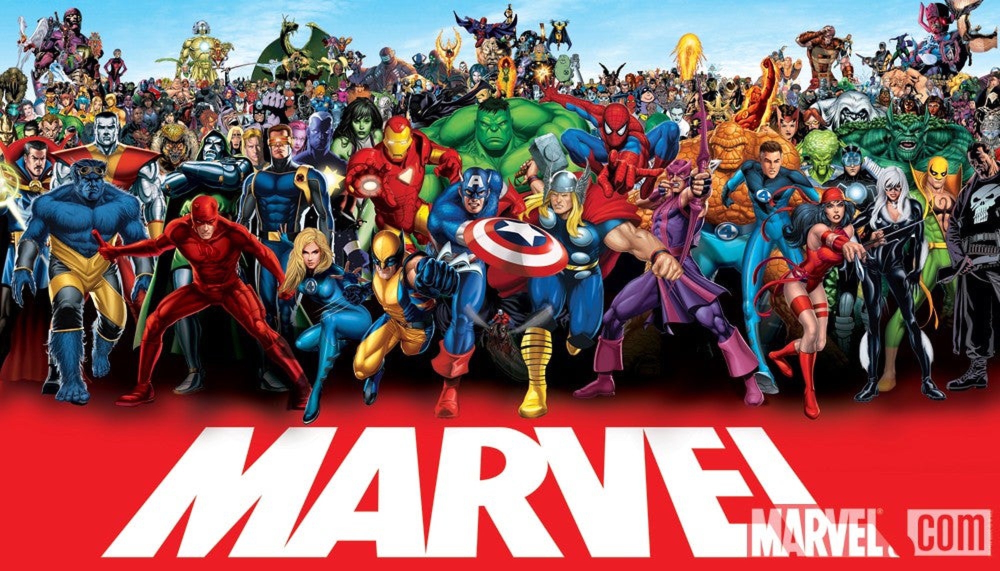

By taking a quick peak at the head of our dataframe, we can get a quick snapshot of some of the field we can use to visualize.

In [ ]:
marvel.head()

As stated above, we can quickly fill all the string columns with missing values as "Missing Info".

In [ ]:
string_cols = ['ID','ALIGN','EYE','HAIR','SEX','GSM','ALIVE']
for col in marvel[string_cols]:
    marvel[string_cols]=marvel[string_cols].fillna(value='Missing Info')
    
marvel['APPEARANCES']=marvel['APPEARANCES'].fillna(value=0)
marvel.info()

This looks much better. Next, we need to conduct some pandas magic to get our heros alignment grouped by year to see how character creation has changed from year to year.

In [ ]:
alignment=pd.DataFrame(marvel.groupby('YEAR')['ALIGN'].value_counts())
alignment.columns = ['count']
alignment=alignment.reset_index()
alignment['YEAR'] = alignment['YEAR'].astype('int64')
alignment['YEAR'] = pd.to_datetime(alignment["YEAR"],format='%Y')
alignment.head()

We can now use plotly to get a nice interactive graph to display our new dataframe.

In [ ]:
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
sns.set()
init_notebook_mode(connected=True)

# set up different countries
good = alignment.loc[alignment['ALIGN']=='Good Characters']
neutral = alignment.loc[alignment['ALIGN']=='Bad Characters']
bad = alignment.loc[alignment['ALIGN']=='Neutral Characters']

# select data
count_good = good['count']
year_good = good['YEAR']

count_neutral = neutral['count']
year_neutral = neutral['YEAR']

count_bad = bad['count']
year_bad = bad['YEAR']

# create traces
trace_good = go.Scatter(
    x=year_good,
    y=count_good,
    name = "Heros",
    line = dict(color = 'rgb(89,244,66)'),
    opacity = 0.8)

trace_neutral = go.Scatter(
    x=year_neutral,
    y=count_neutral,
    name = "Neutral Characters",
    line = dict(color = 'rgb(244,232,66)'),
    opacity = 0.8)

trace_bad = go.Scatter(
    x=year_bad,
    y=count_bad,
    name = "Villians",
    line = dict(color = 'rgb(244,66,66)'),
    opacity = 0.8)

data = [trace_good,trace_neutral,trace_bad]

layout = dict(
    title='Heros, Villians, and Neutral Characters: Marvel',
    xaxis=dict(title='Year',rangeslider=dict(visible = True),type='date'),
    yaxis=dict(title='Count of Characters'))
fig = dict(data=data, layout=layout)
iplot(fig)

We can now do the same to see the evolution and incorporation of all different genders through out the years in the Marvel Universe.

In [ ]:
# gender        
gender=pd.DataFrame(marvel.groupby('YEAR')['SEX'].value_counts())
gender.columns = ['count']
gender=gender.reset_index()
gender['YEAR'] = gender['YEAR'].astype('int64')
gender['YEAR'] = pd.to_datetime(gender["YEAR"],format='%Y')

#set seaborn background
sns.set()
init_notebook_mode(connected=True)

# set up different countries
male = gender.loc[gender['SEX']=='Male Characters']
female = gender.loc[gender['SEX']=='Female Characters']
gender_fluid = gender.loc[gender['SEX']=='Genderfluid Characters']
agender = gender.loc[gender['SEX']=='Agender Characters']
unknown =gender.loc[gender['SEX']=='Missing Info']

# select data
count_male = male['count']
year_male = male['YEAR']

count_female = female['count']
year_female = female['YEAR']

count_gender_fluid = gender_fluid['count']
year_gender_fluid = gender_fluid['YEAR']

count_agender = agender['count']
year_agender = agender['YEAR']

count_unknown = unknown['count']
year_unknown = unknown['YEAR']

# create traces
trace_male = go.Scatter(
    x=year_male,
    y=count_male,
    name = "male",
    line = dict(color = 'rgb(89,244,66)'),
    opacity = 0.8)

trace_female = go.Scatter(
    x=year_female,
    y=count_female,
    name = "female",
    line = dict(color = 'rgb(244,232,66)'),
    opacity = 0.8)
    
trace_gender_fluid = go.Scatter(
    x=year_gender_fluid,
    y=count_gender_fluid,
    name = "fluid",
    line = dict(color = 'rgb(244,66,66)'),
    opacity = 0.8)

trace_agender = go.Scatter(
    x=year_agender,
    y=count_agender,
    name = "agender",
    line = dict(color = 'rgb(244,110,66)'),
    opacity = 0.8)

trace_unknown = go.Scatter(
    x=year_unknown,
    y=count_unknown,
    name = "unknown",
    line = dict(color = 'rgb(244,66,210)'),
    opacity = 0.8)

data = [trace_male,
trace_female,
trace_gender_fluid,
trace_agender,
trace_unknown
]

layout = dict(
    title='Marvel Superhero Genders Over the Years',
    xaxis=dict(title='Year',rangeslider=dict(visible = True),type='date'),
    yaxis=dict(title='Count of Characters'))
fig = dict(data=data, layout=layout)
iplot(fig)

Looks like there has been a recent slowdown of character creation of late. Now we can visualize individual traits of heros using an assortment of count plots.

In [ ]:
import seaborn as sns
labels = ['Brown Hair', 'White Hair', 'Black Hair', 'Blond Hair', 'No Hair',
       'Blue Hair', 'Red Hair', 'Bald', 'Auburn Hair', 'Grey Hair',
       'Silver Hair', 'Purple Hair', 'Strawberry Blond Hair',
       'Green Hair', 'Reddish Blond Hair', 'Gold Hair',
       'Information Unavalible', 'Orange Hair', 'Pink Hair',
       'Variable Hair', 'Yellow Hair', 'Light Brown Hair', 'Magenta Hair',
       'Bronze Hair', 'Dyed Hair', 'Orange-brown Hair']
sns.set(rc={'figure.figsize':(20,10)})
sns.set_style("whitegrid")
ax = sns.countplot(x="HAIR", hue="ALIGN", data=marvel, palette="husl")
ax.set_title('Hair Color of Heros and Villians in the Marvel Comic Book Universe')
ax.set_xticklabels(rotation=90,labels=labels)

We can narrow this down to the heros with the most apperances, cutting out any hero wth less than 800 apperances.

In [ ]:
trimmed = marvel.loc[marvel["APPEARANCES"] > 800]
print('There are',len(trimmed),'DC characters with more than 800 apperances.')
trimmed['APPEARANCES'].plot(kind='hist',edgecolor='black',color='red')

In [ ]:
sns.set(rc={'figure.figsize':(20,10)})
sns.set_style("whitegrid")
ax = sns.countplot(x="HAIR", hue="SEX", data=trimmed, palette="husl")
ax.set_xticklabels(rotation=90,labels=labels)

Black Hair seems to the color of choice of characters with high apperances in the Marvel Universe. We can now move on to DC.

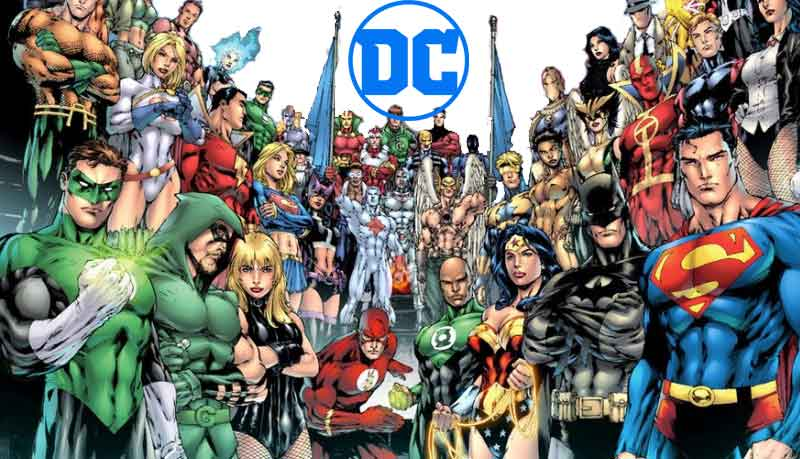

We can quickly replicate the cleaning process from above to ensure data quality.

In [ ]:
dc.head()

In [ ]:
#clean string columns
string_cols = ['ID','ALIGN','EYE','HAIR','SEX','GSM','ALIVE']
for col in dc[string_cols]:
    dc[string_cols]=dc[string_cols].fillna(value='Missing Info')
    
# clean numerical columns
dc['APPEARANCES']=dc['APPEARANCES'].fillna(value=0)

Let's look at alignment and gender over the years for the DC Universe.

In [ ]:
# align         
alignment=pd.DataFrame(dc.groupby('YEAR')['ALIGN'].value_counts())
alignment.columns = ['count']
alignment=alignment.reset_index()
alignment['YEAR'] = alignment['YEAR'].astype('int64')
alignment['YEAR'] = pd.to_datetime(alignment["YEAR"],format='%Y')

# plot
sns.set()
init_notebook_mode(connected=True)

# set up different alignments
good = alignment.loc[alignment['ALIGN']=='Good Characters']
neutral = alignment.loc[alignment['ALIGN']=='Bad Characters']
bad = alignment.loc[alignment['ALIGN']=='Neutral Characters']

# select data
count_good = good['count']
year_good = good['YEAR']

count_neutral = neutral['count']
year_neutral = neutral['YEAR']

count_bad = bad['count']
year_bad = bad['YEAR']

# create traces
trace_good = go.Scatter(
    x=year_good,
    y=count_good,
    name = "Heros",
    line = dict(color = 'rgb(89,244,66)'),
    opacity = 0.8)

trace_neutral = go.Scatter(
    x=year_neutral,
    y=count_neutral,
    name = "Neutral Characters",
    line = dict(color = 'rgb(244,232,66)'),
    opacity = 0.8)

trace_bad = go.Scatter(
    x=year_bad,
    y=count_bad,
    name = "Villians",
    line = dict(color = 'rgb(244,66,66)'),
    opacity = 0.8)

data = [trace_good,trace_neutral,trace_bad]

layout = dict(
    title='Heros, Villians, and Neutral Characters: DC',
    xaxis=dict(title='Year',rangeslider=dict(visible = True),type='date'),
    yaxis=dict(title='Count of Characters'))
fig = dict(data=data, layout=layout)
iplot(fig)

In [ ]:
# gender        
gender=pd.DataFrame(dc.groupby('YEAR')['SEX'].value_counts())
gender.columns = ['count']
gender=gender.reset_index()
gender['YEAR'] = gender['YEAR'].astype('int64')
gender['YEAR'] = pd.to_datetime(gender["YEAR"],format='%Y')

sns.set()
init_notebook_mode(connected=True)

# set up different genders
male = gender.loc[gender['SEX']=='Male Characters']
female = gender.loc[gender['SEX']=='Female Characters']
gender_fluid = gender.loc[gender['SEX']=='Genderless Characters']
agender = gender.loc[gender['SEX']=='Transgender Characters']
unknown =gender.loc[gender['SEX']=='Missing Info']

# select data
count_male = male['count']
year_male = male['YEAR']

count_female = female['count']
year_female = female['YEAR']

count_gender_fluid = gender_fluid['count']
year_gender_fluid = gender_fluid['YEAR']

count_agender = agender['count']
year_agender = agender['YEAR']

count_unknown = unknown['count']
year_unknown = unknown['YEAR']

# create traces
trace_male = go.Scatter(
    x=year_male,
    y=count_male,
    name = "male",
    line = dict(color = 'rgb(89,244,66)'),
    opacity = 0.8)

trace_female = go.Scatter(
    x=year_female,
    y=count_female,
    name = "female",
    line = dict(color = 'rgb(244,232,66)'),
    opacity = 0.8)
    
trace_gender_fluid = go.Scatter(
    x=year_gender_fluid,
    y=count_gender_fluid,
    name = "genderless",
    line = dict(color = 'rgb(244,66,66)'),
    opacity = 0.8)

trace_agender = go.Scatter(
    x=year_agender,
    y=count_agender,
    name = "transgender",
    line = dict(color = 'rgb(244,110,66)'),
    opacity = 0.8)

trace_unknown = go.Scatter(
    x=year_unknown,
    y=count_unknown,
    name = "unknown",
    line = dict(color = 'rgb(244,66,210)'),
    opacity = 0.8)

data = [trace_male,
trace_female,
trace_gender_fluid,
trace_agender,
trace_unknown
]

layout = dict(
    title='DC Superhero Genders Over the Years',
    xaxis=dict(title='Year',rangeslider=dict(visible = True),type='date'),
    yaxis=dict(title='Count of Characters'))
fig = dict(data=data, layout=layout)
iplot(fig)

DC, compared to Marvel, has seen a massive uptick in character creation in the last decade. This interesting as the Marvel Universe unquestionably has had the upper hand in the movie market.

In [ ]:
import seaborn as sns
labels=['Black Hair', 'Brown Hair', 'White Hair', 'Blond Hair', 'Red Hair',
       'Information Unavalible', 'Green Hair', 'Strawberry Blond Hair',
       'Grey Hair', 'Silver Hair', 'Orange Hair', 'Purple Hair',
       'Gold Hair', 'Blue Hair', 'Reddish Brown Hair', 'Pink Hair',
       'Violet Hair', 'Platinum Blond Hair']
sns.set(rc={'figure.figsize':(20,10)})
sns.set_style("whitegrid")
ax = sns.countplot(x="HAIR", hue="ALIGN", data=dc, palette="husl")
ax.set_xticklabels(rotation=90,labels=labels)

No hair on bad guys? No wonder they always lose.

Let's trim the data like we did above again to see which comic line has more high apperance characters.

In [ ]:
trimmed = dc.loc[dc["APPEARANCES"] > 800]
print('There are',len(trimmed),'DC characters with more than 800 apperances.')
trimmed['APPEARANCES'].plot(kind='hist',edgecolor='black')

Marvel has DC beat with 39 to 17 'High Apperance Characters".

In [ ]:
sns.set(rc={'figure.figsize':(20,10)})
sns.set_style("whitegrid")
ax = sns.countplot(x="HAIR", hue="SEX", data=trimmed, palette="husl")

Interesting to see female characters with red hair. Can you guess who it is?

In [ ]:
trimmed.loc[trimmed['HAIR']=='Red Hair']

None other than Barba Gordon, aka, Batgirl.

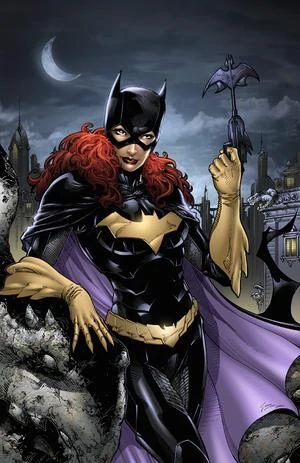

Let's move onto our joint analysis of DC and Marvel.

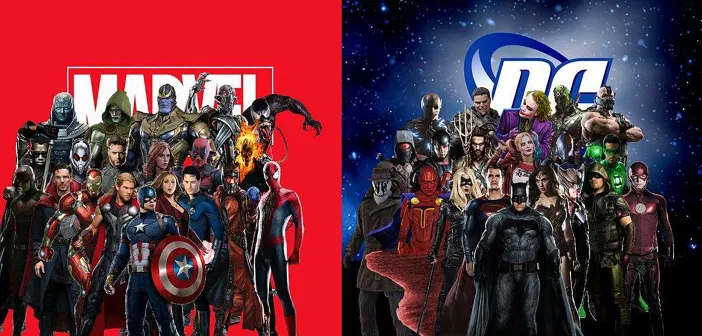

In [ ]:
df = pd.concat([marvel,dc],sort=False)
df.head()

Now we can simply use our code above to conduct the same analysis except on both comic book universes.

In [ ]:
# align         
alignment=pd.DataFrame(df.groupby('YEAR')['ALIGN'].value_counts())
alignment.columns = ['count']
alignment=alignment.reset_index()
alignment['YEAR'] = alignment['YEAR'].astype('int64')
alignment['YEAR'] = pd.to_datetime(alignment["YEAR"],format='%Y')

#plot
sns.set()
init_notebook_mode(connected=True)

# set up different alogns
good = alignment.loc[alignment['ALIGN']=='Good Characters']
neutral = alignment.loc[alignment['ALIGN']=='Bad Characters']
bad = alignment.loc[alignment['ALIGN']=='Neutral Characters']

# select data
count_good = good['count']
year_good = good['YEAR']

count_neutral = neutral['count']
year_neutral = neutral['YEAR']

count_bad = bad['count']
year_bad = bad['YEAR']

# create traces
trace_good = go.Scatter(
    x=year_good,
    y=count_good,
    name = "Heros",
    line = dict(color = 'rgb(89,244,66)'),
    opacity = 0.8)

trace_neutral = go.Scatter(
    x=year_neutral,
    y=count_neutral,
    name = "Neutral Characters",
    line = dict(color = 'rgb(244,232,66)'),
    opacity = 0.8)

trace_bad = go.Scatter(
    x=year_bad,
    y=count_bad,
    name = "Villians",
    line = dict(color = 'rgb(244,66,66)'),
    opacity = 0.8)

data = [trace_good,trace_neutral,trace_bad]

layout = dict(
    title='Heros, Villians, and Neutral Characters: Marvel and DC',
    xaxis=dict(title='Year',rangeslider=dict(visible = True),type='date'),
    yaxis=dict(title='Count of Characters'))
fig = dict(data=data, layout=layout)
iplot(fig)

Seems the readers demand more neutral characters as of late, with an upward trend in villains as well.

In [ ]:
# gender        
gender=pd.DataFrame(df.groupby('YEAR')['SEX'].value_counts())
gender.columns = ['count']
gender=gender.reset_index()
gender['YEAR'] = gender['YEAR'].astype('int64')
gender['YEAR'] = pd.to_datetime(gender["YEAR"],format='%Y')

#plot
sns.set()
init_notebook_mode(connected=True)

# set up different gender
male = gender.loc[gender['SEX']=='Male Characters']
female = gender.loc[gender['SEX']=='Female Characters']
genderless = gender.loc[gender['SEX']=='Genderless Characters']
trans = gender.loc[gender['SEX']=='Transgender Characters']
unknown =gender.loc[gender['SEX']=='Information Unavalible']
gender_fluid = gender.loc[gender['SEX']=='Genderfluid Characters']
agender = gender.loc[gender['SEX']=='Agender Characters']

# select data
count_male = male['count']
year_male = male['YEAR']

count_female = female['count']
year_female = female['YEAR']

count_genderless = genderless['count']
year_genderless = genderless['YEAR']

count_trans = trans['count']
year_trans = trans['YEAR']

count_gender_fluid = gender_fluid['count']
year_gender_fluid = gender_fluid['YEAR']

count_agender = agender['count']
year_agender = agender['YEAR']

count_unknown = unknown['count']
year_unknown = unknown['YEAR']

# create traces
trace_male = go.Scatter(
    x=year_male,
    y=count_male,
    name = "male",
    line = dict(color = 'rgb(89,244,66)'),
    opacity = 0.8)

trace_female = go.Scatter(
    x=year_female,
    y=count_female,
    name = "female",
    line = dict(color = 'rgb(244,232,66)'),
    opacity = 0.8)
    

trace_genderless = go.Scatter(
    x=year_genderless,
    y=count_genderless,
    name = "genderless",
    line = dict(color = 'rgb(244,66,66)'),
    opacity = 0.8)

trace_trans = go.Scatter(
    x=year_trans,
    y=count_trans,
    name = "transgender",
    line = dict(color = 'rgb(244,110,66)'),
    opacity = 0.8)


trace_gender_fluid = go.Scatter(
    x=year_gender_fluid,
    y=count_gender_fluid,
    name = "fluid",
    line = dict(color = 'rgb(10,10,200)'),
    opacity = 0.8)

trace_agender = go.Scatter(
    x=year_agender,
    y=count_agender,
    name = "agender",
    line = dict(color = 'rgb(100,0,66)'),
    opacity = 0.8)


trace_unknown = go.Scatter(
    x=year_unknown,
    y=count_unknown,
    name = "unknown",
    line = dict(color = 'rgb(244,66,210)'),
    opacity = 0.8)

data = [trace_male,
trace_female,
trace_genderless,
trace_gender_fluid,
trace_agender,
trace_trans,
trace_unknown
]


layout = dict(
    title='DC & Marvel Superhero Genders Over the Years',
    xaxis=dict(title='Year',rangeslider=dict(visible = True),type='date'),
    yaxis=dict(title='Count of Characters'))
fig = dict(data=data, layout=layout)
iplot(fig)

As we can see, the comic book universe could a little more diversity. Let's trim again to 800 apperances to conduct the same analysis as above.

In [ ]:
trimmed = df.loc[marvel["APPEARANCES"] >= 800]
print('Combined, there are',len(trimmed),' Marvel and DC characters with more than 800 apperances.')
trimmed['APPEARANCES'].plot(kind='hist',edgecolor='black')

Let's look at the top ten heros and villians with the most apperances.

In [ ]:
trimmed.sort_values('APPEARANCES',ascending=False).head(10)

In [ ]:
sns.set(rc={'figure.figsize':(20,10)})
labels = ['Brown Hair', 'White Hair', 'Black Hair', 'Blond Hair', 'No Hair',
       'Blue Hair', 'Red Hair', 'Bald', 'Auburn Hair', 'Grey Hair',
       'Information Unavalible', 'Green Hair']
sns.set_style("whitegrid")
ax = sns.countplot(x="HAIR", hue="SEX", data=trimmed, palette="husl")
ax.set_title('Hair Color of Different Gender Characters')
ax.set_xticklabels(rotation=90,labels=labels)

We can finalize our analysis by taking a look at the indentities of our heros and villians seeing how they differ.

In [ ]:
ids = pd.DataFrame(df.groupby('ID')['ALIGN'].value_counts())
ids.columns = ['count']
ids

In [ ]:
sns.set(rc={'figure.figsize':(20,10)})
sns.set_style("whitegrid")
ax = sns.countplot(x="ID", hue="ALIGN", data=df, palette="husl")
ax.set_title('Identites of Heros and Villians in the Comic Book Universe')
total=4490+2465+957+770+1
print(round(4490/total,2), 'percent of bad guys have a secret identity.')
total=2930+2172+965+926
print(round(2930/total,2), 'percent of good guys have a public identity.')

Good guys are okay with public knowing who they whereas bad guys ..... not so much.